In [3]:
%autosave 0



Autosave disabled


<div style="background: #DDE2FF;
            font-family: Bookerly;
            font-size: 14px; 
            font-weight: 500;
            padding: 30px 5px 30px 5px; 
            border: 30px solid #DDE2FF; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>(Custom CSS files are not reliable for controlling Jupyter font style. To establish the same appearance as the original notebook, depend on the browser to control the font, by setting the desired font faces in the browser settings. For example, Chrome 135 or Firefox 134 can do this. In this notebook series, Bookerly font is for markdown and Monaco is for code.)
     
     
     

</font>                 
</div>

In [1]:
!pip3 install scikit-fem



     -------------------------------------- 157.8/157.8 kB 3.1 MB/s eta 0:00:00


<div style="background: #DDE2FF;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 20px 5px 20px 5px; 
            border: 30px solid #DDE2FF; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>
 <font color='blue'>**Chapter 31-15 Solving PDEs with the Finite Element Method**.
 
 The finite element method (FEM) is a popular method for numerically solving differential equations arising in engineering and mathematical modeling. Typical problem areas of interest include the traditional fields of structural analysis, heat transfer, fluid flow, mass transport, and electromagnetic potential.

The FEM is a general numerical method for solving partial differential equations in two or three space variables (i.e., some boundary value problems). To solve a problem, the FEM subdivides a large system into smaller, simpler parts that are called finite elements. This is achieved by a particular space discretization in the space dimensions, which is implemented by the construction of a mesh of the object: the numerical domain for the solution, which has a finite number of points. The finite element method formulation of a boundary value problem finally results in a system of algebraic equations. The method approximates the unknown function over the domain. The simple equations that model these finite elements are then assembled into a larger system of equations that models the entire problem. The FEM then approximates a solution by minimizing an associated error function via the calculus of variations. 

Note1: from Wikipedia <br>
Note2: This notebook contains work in both Octave and Python formats 
     
     
     

</font>                 
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 20px 5px 20px 5px; 
            border: 30px solid #FFE3CC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>1. This problem depends on material from Chapters 6 and 8 of the book *Numerical Solution of Differential Equations -- Introduction to Finite Difference and Finite Element Methods* by Li, Qiao, and Tang. At the address *https://zhilin.math.ncsu.edu/* is Li's page featuring details about the book. There is a button on the page, just underneath the book title, with the label "Matlab Codes". The download will be entitled "DE_FEM_Matlab_Code.zip"  All of the files in the folder with the title "Chapter 6" should be loaded into Octave. Only one will execute in Octave, the one entitled **drive.m**.  This file is shown below. 

     
     
     

</font> 
</div>

In [ ]:
clear all; close all;   % Clear every thing so it won't mess up with other
                        % existing variables.

%%%%%% Generate a triangulation

 x(1)=0; x(2)=0.1; x(3)=0.3; x(4)=0.333; x(5)=0.5; x(6)=0.75;x(7)=1;

%x=0:0.05:1;

%%%%%% Call fem1d function to get the FEM solution at nodal points.

U = fem1d(x);

%%%%%% Compare errors:

x2 = 0:0.01:1; k2 = length(x2);
for i=1:k2,
  u_exact(i) = soln(x2(i));
  u_fem(i) = fem_soln(x,U,x2(i));  % Compute FEM solution at x2(i)
end

error = norm(u_fem-u_exact,inf)  % Compute the infinity error
   
plot(x2,u_fem,'-.', x2,u_exact)   % Solid: the exact, %dotted: FEM solution
hold; plot(x,U,'o')              % Mark the solution at nodal points.
% set(gca,'FontSize',18);
xlabel('x'); ylabel('u(x) & u_{fem}(x)'); 
title('Solid line: Exact solution, Dotted line: FEM solution')

figure(2); % set(gca,'FontSize',18);
plot(x2,u_fem-u_exact); title('Error plot')   
xlabel('x'); ylabel('u-u_{fem}');  title('Error Plot')



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>If access to the book mentioned above is possible, some good info regarding the relation between PDEs and finite element modeling can be learned. 

The plots which are produced by running the code in the above cell are shown below.

</font>                 
</div>

<img src="image01.svg" />

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 20px 5px 20px 5px; 
            border: 30px solid #FFE3CC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>3. For the initial conditions shown in the comment banner in the cell below, construct a 1-dimensional finite element solution and plot.
     
     
     

</font> 
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>The plot below on the left shows the error; the plot on the right shows the analytical solution.

</font>                 
</div>

In [ ]:

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%                                                                    %
%  Matlab program for one-dimensinal finite element method for       %
%                                                                    %
%    -(k(x)u_x)_x + c(x) u_x + b(x) u(x) = f(x)                      %
%                                                                    %
%  with different boundary condition at x =0, and x = l              %
%                                                                    %
%--------------------------------------------------------------------%

	function [x,u]= fem1d

   clear
%  Preprocessor:

   global nnode nelem 
   global gk gf
   global xi  w

%%%%%%%%% Start the program %%%%%%%%%

%   clear

   [xi,w] = setint;   % Get Gaussian points and weights.

%  Preprocessor:
   [x,kbc,vbc,kind,nint,nodes] = propset;	      % Input data

    formkf(kind,nint,nodes,x,xi,w);   % Form the discrete system

    aplybc(kbc,vbc);
      
    u = gk\gf;	                % Solve the linear system.

    for i=1:nnode,
      e(i) = u(i) - uexact(x(i));
    end
    figure(1); plot(x,e)
    figure(2); plot(x,u)

 

<img src="image02.svg" />

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>The FEnics package requires Dolfin as a component, and Dolfin can be hard to install. NGSolve requires the MKL library, which is a big download if the CPU is not Intel. Some other finite element packages require Petsc, which can be difficult to get running, even on Linux.

In Contrast, the Python module scikit-fem is a lightweight but sturdy implement for finite element calculations in Python. It does not need compiling, and also entails no dependencies for the average Python installation. The next few cells below contain the first exercise in the Getting Started section of the scikit-fem documentation.

</font>                 
</div>

<div style="background: #FFE3CC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 20px 5px 20px 5px; 
            border: 30px solid #FFE3CC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>4. Solve the Poisson problem

$$-\Delta u\,=\,f\hspace{2 cm}\textrm{in} \:\:\Omega$$

$$\hspace{1 cm}u\,=\,0\hspace{2.2 cm}\textrm{on} \:\:\partial\,\Omega$$

where $\,\Omega \,=\,(0,1)^2\,$ is a square domain and $\:f(x,y)\,=\,\textrm{sin}\,\pi x\,\textrm{sin}\,\pi\,y\,$
     
     

</font> 
</div>

In [1]:
import skfem as fem
>>> from skfem.helpers import dot, grad  # helpers make forms look nice
>>> @fem.BilinearForm
... def a(u, v, _):
...     return dot(grad(u), grad(v))



In [2]:
import numpy as np
>>> @fem.LinearForm
... def L(v, w):
...     x, y = w.x  # global coordinates
...     f = np.sin(np.pi * x) * np.sin(np.pi * y)
...     return f * v



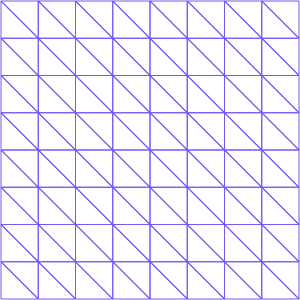

In [4]:
mesh = fem.MeshTri().refined(3)  # refine thrice
mesh



In [6]:
Vh = fem.Basis(mesh, fem.ElementTriP1())
Vh



<skfem CellBasis(MeshTri1, ElementTriP1) object>
  Number of elements: 128
  Number of DOFs: 81
  Size: 27648 B

In [9]:
A = a.assemble(Vh)
l = L.assemble(Vh)
A.shape



(81, 81)

In [10]:
l.shape



(81,)

In [11]:
D = Vh.get_dofs()
D



<skfem DofsView(MeshTri1, ElementTriP1) object>
  Number of nodal DOFs: 32 ['u']

In [13]:
x = fem.solve(*fem.condense(A, l, D=D))
x.shape



(81,)

In [15]:
@fem.Functional
def error(w):
    x, y = w.x
    uh = w['uh']
    u = np.sin(np.pi * x) * np.sin(np.pi * y) / (2. * np.pi ** 2)
    return (uh - u) ** 2
round(error.assemble(Vh, uh=Vh.interpolate(x)), 9)
        
    

1.069e-06

In [17]:
"""Discontinuous Galerkin method."""

from skfem import *
from skfem.helpers import grad, dot, jump
from skfem.models.poisson import laplace, unit_load

m = MeshTri.init_sqsymmetric().refined()
e = ElementTriDG(ElementTriP4())
alpha = 1e-3

ib = Basis(m, e)
bb = FacetBasis(m, e)
fb = [InteriorFacetBasis(m, e, side=i) for i in [0, 1]]

@BilinearForm
def dgform(u, v, p):
    ju, jv = jump(p, u, v)
    h = p.h
    n = p.n
    return ju * jv / (alpha * h) - dot(grad(u), n) * jv - dot(grad(v), n) * ju

@BilinearForm
def nitscheform(u, v, p):
    h = p.h
    n = p.n
    return u * v / (alpha * h) - dot(grad(u), n) * v - dot(grad(v), n) * u

A = asm(laplace, ib)
B = asm(dgform, fb, fb)
C = asm(nitscheform, bb)
b = asm(unit_load, ib)

x = solve(A + B + C, b)

M, X = ib.refinterp(x, 4)

def visualize():
    from skfem.visuals.matplotlib import plot, draw
    %config InlineBackend.figure_formats = ['svg']

    ax = draw(M, boundaries_only=True)
    return plot(M, X, shading="gouraud", ax=ax, colorbar=True)

if __name__ == "__main__":
    visualize().show()
    
    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>The Github repository of _gdmcbain/fenics-tuto-in-skfem_ contains eight exercises from the FEnics tutorial book. FEnics's great popularity no doubts stems largely from the book by Langtangen and Logg, entitled *Solving PDEs in Python: The FEnics Tutorial I*, a full-length book about using FEnics for finite element solutions of PDEs. This book can be accessed on line or downloaded for free. Since FEnics is such a popular package, it is natural for someone to wonder if the new, little-known and somewhat brash program scikit-fem could reproduce the results of the FEnics tutorials. (Spoiler: it can, with considerably less trouble.) Below are six of the eight problems of the collection. (Note: problems 2 and 6 could not be attempted because they require a commercial program for execution.)
</font>                 
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>FEnics exercise #1 below, executed by scikit-fem.
</font>                 
</div>


Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

error_L2  = 3.090730095650652e-16
error_max = 1.1102230246251565e-15


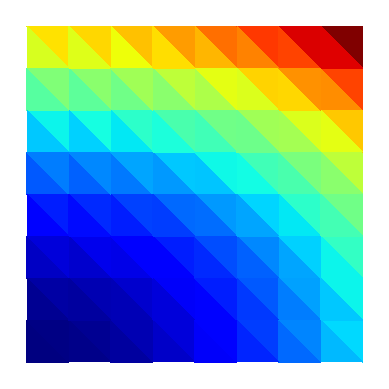

In [1]:
import numpy as np

from skfem import *
from skfem.models.poisson import laplace, unit_load, mass

mesh = MeshTri().refined(3)
mesh

V = InteriorBasis(mesh, ElementTriP1())

u_D = 1 + [1, 2] @ mesh.p ** 2

boundary = mesh.boundary_nodes()

u = np.zeros_like(u_D)
u[boundary] = u_D[boundary]

a = asm(laplace, V)
L = -6.0 * asm(unit_load, V)

u = solve(*condense(a, L, u, D=boundary))

ax = mesh.plot(u)
ax.get_figure().savefig("poisson.svg")

mesh.save("fenics01.ply")

error = u - u_D
print("error_L2  =", np.sqrt(error.T @ asm(mass, V) @ error))
print("error_max =", np.linalg.norm(error, np.inf))



<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>FEnics exercise #3 below, executed by scikit-fem.
</font>                 
</div>


C:\Users\gary\AppData\Local\Temp/ipykernel_7460/3832573378.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


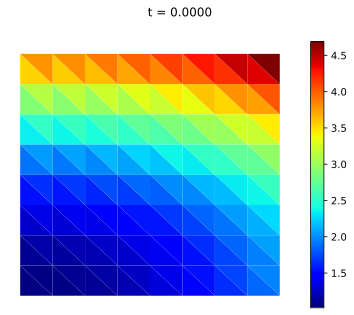

t = 0.20: error = 9.44e-15
t = 0.40: error = 1.25e-14
t = 0.60: error = 1.45e-14
t = 0.80: error = 1.7e-14
t = 1.00: error = 1.68e-14
t = 1.20: error = 1.89e-14
t = 1.40: error = 2.01e-14
t = 1.60: error = 2.01e-14
t = 1.80: error = 2.16e-14
t = 2.00: error = 2.34e-14
t = 2.20: error = 2.46e-14


In [2]:
from matplotlib.pyplot import subplots, pause
# %matplotlib qt
import numpy as np
%config InlineBackend.figure_formats = ['svg']

from skfem import *
from skfem.models.poisson import laplace, mass, unit_load

alpha = 3.0
beta = 1.2

nx = ny = 2 ** 3

time_end = 2.0
num_steps = 10
dt = time_end / num_steps

mesh = (
    MeshLine(np.linspace(0, 1, nx + 1)) * MeshLine(np.linspace(0, 1, ny + 1))
).to_meshtri()
basis = InteriorBasis(mesh, ElementTriP1())

boundary = basis.get_dofs().all()
interior = basis.complement_dofs(boundary)

M = asm(mass, basis)
A = M + dt * asm(laplace, basis)
f = (beta - 2 - 2 * alpha) * asm(unit_load, basis)

fig, ax = subplots()


def dirichlet(t: float) -> np.ndarray:
    return 1.0 + [1.0, alpha] @ mesh.p ** 2 + beta * t


t = 0.0
u = dirichlet(t)

zlim = (0, np.ceil(1 + alpha + beta * time_end))

for i in range(num_steps + 1):

    ax.cla()
    ax.axis("off")
    fig.suptitle("t = {:.4f}".format(t))
    mesh.plot(u, ax=ax, zlim=zlim)
    if t == 0.0:
        fig.colorbar(ax.get_children()[0])
    fig.show()
    pause(1.0)

    t += dt
    b = dt * f + M @ u

    u_D = dirichlet(t)
    u = solve(*condense(A, b, u_D, D=boundary))
    error = np.linalg.norm(u - u_D)
    print("t = %.2f: error = %.3g" % (t, error))

    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>FEnics exercise #4 below, executed by scikit-fem.
</font>                 
</div>


C:\Users\gary\AppData\Local\Temp/ipykernel_7460/3973729471.py:48: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


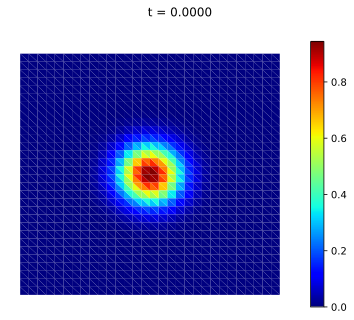

In [3]:
from pathlib import Path

from matplotlib.pyplot import subplots, pause
import numpy as np

from skfem import *
from skfem.models.poisson import laplace, mass

a = 5.0

nx = ny = 30

time_end = 2.0
num_steps = 50
dt = time_end / num_steps

mesh = (
    MeshLine(np.linspace(-2, 2, nx + 1)) * MeshLine(np.linspace(-2, 2, ny + 1))
).to_meshtri()
basis = InteriorBasis(mesh, ElementTriP1())

boundary = basis.get_dofs().all()
interior = basis.complement_dofs(boundary)

M = asm(mass, basis)
A = M + dt * asm(laplace, basis)

fig, ax = subplots()

t = 0.0
u = np.exp(-a * (np.sum(mesh.p ** 2, axis=0)))  # initial condition, P1 only

output_dir = Path("heat_gaussian")
try:
    output_dir.mkdir()
except FileExistsError:
    pass

for i in range(num_steps + 1):

    ax.cla()
    ax.axis("off")
    fig.suptitle("t = {:.4f}".format(t))
    mesh.plot(u, ax=ax, zlim=(0, 1))
    if t == 0.0:
        fig.colorbar(ax.get_children()[0])
        fig.savefig("initial.png")
    fig.show()
    pause(0.01)

    t += dt
    b = M @ u

    u = solve(*condense(A, b, D=boundary))

    mesh.save(str(output_dir.joinpath(f"solution{i:06d}.msh")), {"temperature": u})
    
    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>The color bar for the above figure is cut off by the Github rendering time limit. It can be seen in the .pdf version
</font>                 
</div>

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>FEnics exercise #5 below, executed by scikit-fem.
</font>                 
</div>


Success.  Residual = 1.4058151617812875e-07
Nodal Linf error = 1.2228777324096995e-08


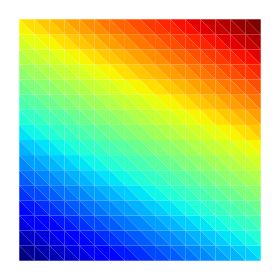

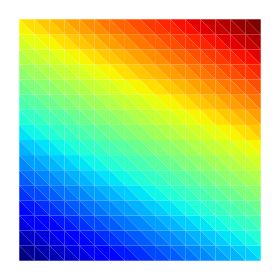

In [18]:
from pathlib import Path

import numpy as np
from scipy.optimize import root

from sympy import symbols
from sympy.vector import CoordSys3D, gradient, divergence
from sympy.utilities.lambdify import lambdify

from skfem import (
    MeshTri,
    InteriorBasis,
    ElementTriP1,
    BilinearForm,
    LinearForm,
    asm,
    solve,
    condense,
)
from skfem.models.poisson import laplace
from skfem.visuals.matplotlib import plot
%config InlineBackend.figure_formats = ['svg']


output_dir = Path("poisson_nonlinear")

try:
    output_dir.mkdir()
except FileExistsError:
    pass


def q(u):
    """Return nonlinear coefficient"""
    return 1 + u * u


R = CoordSys3D("R")


def apply(f, coords):
    x, y = symbols("x y")
    return lambdify((x, y), f.subs({R.x: x, R.y: y}))(*coords)


u_exact = 1 + R.x + 2 * R.y  # exact solution
f = -divergence(q(u_exact) * gradient(u_exact))  # manufactured RHS

mesh = MeshTri().refined(3)  # refine thrice

V = InteriorBasis(mesh, ElementTriP1())

boundary = V.get_dofs().all()
interior = V.complement_dofs(boundary)


@LinearForm
def load(v, w):
    return v * apply(f, w.x)


b = asm(load, V)


@BilinearForm
def diffusion_form(u, v, w):
    return sum(v.grad * (q(w["w"]) * u.grad))


def diffusion_matrix(u):
    return asm(diffusion_form, V, w=V.interpolate(u))


dirichlet = apply(u_exact, mesh.p)  # P1 nodal interpolation
plot(V, dirichlet).get_figure().savefig(str(output_dir.joinpath("exact.png")))


def residual(u):
    r = b - diffusion_matrix(u) @ u
    r[boundary] = 0.0
    return r


u = np.zeros(V.N)
u[boundary] = dirichlet[boundary]
result = root(residual, u, method="krylov")

if result.success:
    u = result.x
    print("Success.  Residual =", np.linalg.norm(residual(u), np.inf))
    print("Nodal Linf error =", np.linalg.norm(u - dirichlet, np.inf))
    plot(V, u).get_figure().savefig(str(output_dir.joinpath("solution.png")))
else:
    print(result)
    
    

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>FEnics exercise #7 below, executed by scikit-fem. 
</font>                 
</div>

In [3]:
from pathlib import Path

import numpy as np

import skfem
from skfem.models.poisson import vector_laplace, laplace
from skfem.models.general import divergence

from meshio.xdmf import TimeSeriesWriter


@skfem.BilinearForm
def vector_mass(u, v, w):
    return sum(v * u)


@skfem.BilinearForm
def port_pressure(u, v, w):
    return sum(v * (u * w.n))


p_inlet = 8.0

#mesh = skfem.MeshTri()
#mesh.refine(3)
mesh = MeshTri().refined(3)

boundary = {
    "inlet": mesh.facets_satisfying(lambda x: x[0] == 0),
    "outlet": mesh.facets_satisfying(lambda x: x[0] == 1),
    "wall": mesh.facets_satisfying(lambda x: np.logical_or(x[1] == 0, x[1] == 1)),
}
boundary["ports"] = np.concatenate([boundary["inlet"], boundary["outlet"]])

element = {"u": skfem.ElementVectorH1(skfem.ElementTriP2()), "p": skfem.ElementTriP1()}
basis = {
    **{v: skfem.InteriorBasis(mesh, e, intorder=4) for v, e in element.items()},
    **{
        label: skfem.FacetBasis(mesh, element["u"], facets=boundary[label])
        for label in ["inlet", "outlet"]
    },
}


M = skfem.asm(vector_mass, basis["u"])
L = {"u": skfem.asm(vector_laplace, basis["u"]), "p": skfem.asm(laplace, basis["p"])}
B = -skfem.asm(divergence, basis["u"], basis["p"])
P = B.T + skfem.asm(
    port_pressure,
    *(
        skfem.FacetBasis(mesh, element[v], facets=boundary["ports"], intorder=3)
        for v in ["p", "u"]
    )
)

t_final = 1.0
dt = 0.05

dirichlet = {
    "u": basis["u"].get_dofs(boundary["wall"]).all(),
    "p": np.concatenate([basis["p"].get_dofs(boundary["ports"]).all()]),
}
inlet_pressure_dofs = basis["p"].get_dofs(boundary["inlet"]).all()

uv_, p_ = (np.zeros(basis[v].N) for v in element.keys())  # penultimate
p__ = np.zeros_like(p_)  # antepenultimate

K = M / dt + L["u"]

t = 0

with TimeSeriesWriter("channel.xdmf") as writer:

    writer.write_points_cells(mesh.p.T, {"triangle": mesh.t.T})

    while t < t_final:

        t += dt

        # Step 1: Momentum prediction (Ern & Guermond 2002, eq. 7.40, p. 274)

        uv = skfem.solve(
            *skfem.condense(
                K,
                (M / dt) @ uv_ - P @ (2 * p_ - p__),
                np.zeros_like(uv_),
                D=dirichlet["u"],
            )
        )

        # Step 2: Projection (Ern & Guermond 2002, eq. 7.41, p. 274)

        dp = np.zeros(basis["p"].N)
        dp[inlet_pressure_dofs] = p_inlet - p_[inlet_pressure_dofs]

        dp = skfem.solve(*skfem.condense(L["p"], B @ uv, dp, D=dirichlet["p"]))

        # Step 3: Recover pressure and velocity (E. & G. 2002, p. 274)

        p = p_ + dp
        print(min(p), "<= p <= ", max(p))

        du = skfem.solve(*skfem.condense(M / dt, -P @ dp, D=dirichlet["u"]))
        u = uv + du

        uv_ = uv
        p_, p__ = p, p_

        # postprocessing
        writer.write_data(
            t,
            point_data={
                "pressure": p,
                "velocity": np.pad(
                    u[basis["u"].nodal_dofs].T, ((0, 0), (0, 1)), "constant"
                ),
            },
        )

        print(min(u[::2]), "<= u <= ", max(u[::2]), "||v|| = ", np.linalg.norm(u[1::2]))


# References

#  Ern, A., Guermond, J.-L. (2002). _Éléments finis : théorie,
#  applications, mise en œuvre_ (Vol. 36). Paris: Springer. ISBN:
#  3540426159



0.0 <= p <=  8.0
0.0 <= u <=  0.5322508243494332 ||v|| =  4.026720129295742e-14
0.0 <= p <=  8.0
0.0 <= u <=  0.6309113809656185 ||v|| =  1.436588597740157e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.7616343911111542 ||v|| =  1.90715233764314e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.8422995060746478 ||v|| =  2.4372603252675528e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.8947839812242627 ||v|| =  2.810672594345035e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.9296216090981441 ||v|| =  3.052360984815118e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.9528899755044427 ||v|| =  3.190213298235965e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.9684589961632456 ||v|| =  3.2489532651000665e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.9788815550706454 ||v|| =  3.2490550626528445e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.9858598213872569 ||v|| =  3.206844857583792e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.9905321915694375 ||v|| =  3.135004182450136e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.9936606578490389 ||v|| =  3.0431839802365636e-05
0.0 <= p <=  8.0
0.0 <= u <=  0.99575

<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>FEnics exercise #8 below, executed by scikit-fem. Note: In this case it is necessary to set the inline backend to "retina", because the .svg backend scrambles the graphic. (Whatever it is, "retina" seems to  match vector image quality, so it is considered a player of equal skill.
</font>                 
</div>

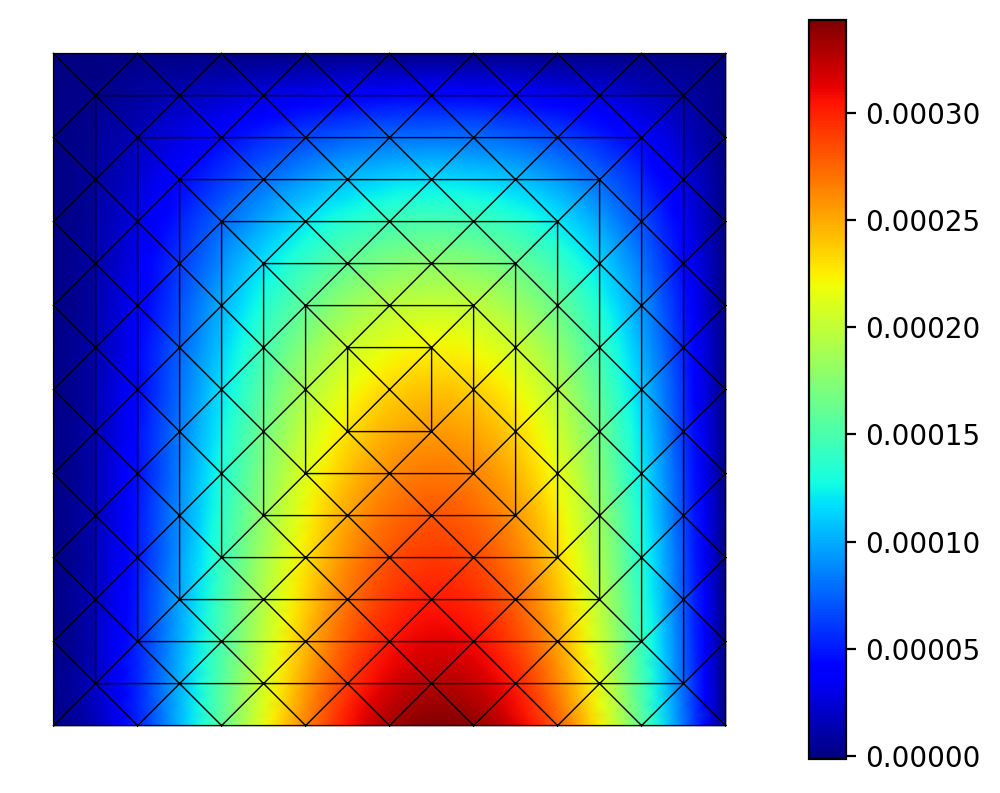

In [5]:
r"""
This example demonstrates the solution of a slightly more complicated problem
with multiple boundary conditions and a fourth-order differential operator. We
consider the `Kirchhoff plate bending problem
<https://en.wikipedia.org/wiki/Kirchhoff%E2%80%93Love_plate_theory>`_ which
finds its applications in solid mechanics. For a stationary plate of constant
thickness :math:`d`, the governing equation reads: find the deflection :math:`u
: \Omega \rightarrow \mathbb{R}` that satisfies
.. math::
    \frac{Ed^3}{12(1-\nu^2)} \Delta^2 u = f \quad \text{in $\Omega$},
where :math:`\Omega = (0,1)^2`, :math:`f` is a perpendicular force,
:math:`E` and :math:`\nu` are material parameters.
In this example, we analyse a :math:`1\,\text{m}^2` plate of steel with thickness :math:`d=0.1\,\text{m}`.
The Young's modulus of steel is :math:`E = 200 \cdot 10^9\,\text{Pa}` and Poisson
ratio :math:`\nu = 0.3`.
In reality, the operator
.. math::
    \frac{Ed^3}{12(1-\nu^2)} \Delta^2 
is a combination of multiple first-order operators:
.. math::
    \boldsymbol{K}(u) = - \boldsymbol{\varepsilon}(\nabla u), \quad \boldsymbol{\varepsilon}(\boldsymbol{w}) = \frac12(\nabla \boldsymbol{w} + \nabla \boldsymbol{w}^T),
.. math::
    \boldsymbol{M}(u) = \frac{d^3}{12} \mathbb{C} \boldsymbol{K}(u), \quad \mathbb{C} \boldsymbol{T} = \frac{E}{1+\nu}\left( \boldsymbol{T} + \frac{\nu}{1-\nu}(\text{tr}\,\boldsymbol{T})\boldsymbol{I}\right),
where :math:`\boldsymbol{I}` is the identity matrix. In particular,
.. math::
    \frac{Ed^3}{12(1-\nu^2)} \Delta^2 u = - \text{div}\,\textbf{div}\,\boldsymbol{M}(u).
There are several boundary conditions that the problem can take.
The *fully clamped* boundary condition reads
.. math::
    u = \frac{\partial u}{\partial \boldsymbol{n}} = 0,
where :math:`\boldsymbol{n}` is the outward normal.
Moreover, the *simply supported* boundary condition reads
.. math::
    u = 0, \quad M_{nn}(u)=0,
where :math:`M_{nn} = \boldsymbol{n} \cdot (\boldsymbol{M} \boldsymbol{n})`.
Finally, the *free* boundary condition reads
.. math::
    M_{nn}(u)=0, \quad V_{n}(u)=0,
where :math:`V_n` is the `Kirchhoff shear force <https://arxiv.org/pdf/1707.08396.pdf>`_. The exact
definition is not needed here as this boundary condition is a
natural one.
The correct weak formulation for the problem is: find :math:`u \in V` such that
.. math::
    \int_\Omega \boldsymbol{M}(u) : \boldsymbol{K}(v) \,\mathrm{d}x = \int_\Omega fv \,\mathrm{d}x \quad \forall v \in V,
where :math:`V` is now a subspace of :math:`H^2` with the essential boundary
conditions for :math:`u` and :math:`\frac{\partial u}{\partial \boldsymbol{n}}`.
Instead of constructing a subspace for :math:`H^2`, we discretise the problem
using the `non-conforming Morley finite element
<https://users.aalto.fi/~jakke74/WebFiles/Slides-Niiranen-ADMOS-09.pdf>`_ which
is a piecewise quadratic :math:`C^0`-continuous element for biharmonic problems.
The full source code of the example reads as follows:
.. literalinclude:: examples/ex02.py
    :start-after: EOF"""
from skfem import *
from skfem.models.poisson import unit_load
import numpy as np
%config InlineBackend.figure_formats = ['retina']

m = (
    MeshTri.init_symmetric()
    .refined(3)
    .with_boundaries(
        {
            "left": lambda x: x[0] == 0,
            "right": lambda x: x[0] == 1,
            "top": lambda x: x[1] == 1,
        }
    )
)

e = ElementTriMorley()
ib = Basis(m, e)


@BilinearForm
def bilinf(u, v, w):
    from skfem.helpers import dd, ddot, trace, eye
    d = 0.1
    E = 200e9
    nu = 0.3

    def C(T):
        return E / (1 + nu) * (T + nu / (1 - nu) * eye(trace(T), 2))

    return d**3 / 12.0 * ddot(C(dd(u)), dd(v))


K = asm(bilinf, ib)
f = 1e6 * asm(unit_load, ib)

D = np.hstack([ib.get_dofs("left"), ib.get_dofs({"right", "top"}).all("u")])

x = solve(*condense(K, f, D=D))

def visualize():
    from skfem.visuals.matplotlib import draw, plot
    ax = draw(m)
    return plot(ib,
                x,
                ax=ax,
                shading='gouraud',
                colorbar=True,
                nrefs=2)

if __name__ == "__main__":
    visualize().show()


    
    
    
    
    
 




<div style="background: #E2FFCC;
            font-family: Bookerly;
            font-size: 16px; 
            font-weight: 500;
            padding: 10px 5px 10px 5px; 
            border: 30px solid #E2FFCC; 
            margin-left: 1px;
            margin-right: 1px;"

<font color='blue'>The following cell shows an example from the scikit-fem documentation, _Example 11: Three-dimensional linear elasticity._
</font>                 
</div>

In [12]:
r"""Linear elasticity.
This example solves the linear elasticity problem using trilinear elements.  The
weak form of the linear elasticity problem is defined in
:func:`skfem.models.elasticity.linear_elasticity`.
"""

import numpy as np
from skfem import *
from skfem.models.elasticity import linear_elasticity, lame_parameters

m = MeshHex().refined(3)
e1 = ElementHex1()
e = ElementVector(e1)
ib = Basis(m, e, MappingIsoparametric(m, e1), 3)

K = asm(linear_elasticity(*lame_parameters(1e3, 0.3)), ib)

dofs = {
    'left' : ib.get_dofs(lambda x: x[0] == 0.0),
    'right': ib.get_dofs(lambda x: x[0] == 1.0),
}

u = ib.zeros()
u[dofs['right'].nodal['u^1']] = 0.3

I = ib.complement_dofs(dofs)

u = solve(*condense(K, x=u, I=I))

sf = 1.0
m = m.translated(sf * u[ib.nodal_dofs])

if __name__ == "__main__":
    from os.path import splitext
    from sys import argv
    
    #m.save(splitext(argv[0])[0] + '.vtk')
    m.save('testimg' + '.vtk')
    

    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    

<img src="image03.svg" />